In [4]:
!pip install opendatasets

In [5]:
import opendatasets as od
import os
from google.colab import files

import matplotlib.pyplot as plt
import random
from PIL import Image
import seaborn as sns

from keras.preprocessing.image import ImageDataGenerator

from sklearn.model_selection import train_test_split

import tensorflow as tf
from keras.applications import VGG19


from keras.models import Model, load_model
from keras.layers import Dense, Flatten, GlobalAveragePooling2D
from keras.optimizers import Adam

import pandas as pd
import numpy as np

from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

In [6]:
# {"username":"miguelgallego","key":"6a7a2546d0b0a5683db1abd67fc0380c"}
dataset_link = "https://www.kaggle.com/datasets/harishkumardatalab/food-image-classification-dataset"
od.download(dataset_link)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: miguelgallego
Your Kaggle Key: ··········


100%|██████████| 1.68G/1.68G [00:22<00:00, 79.7MB/s]


In [7]:
# Ruta de la carpeta principal del conjunto de datos
dataset_dir = "/content/food-image-classification-dataset/Food Classification dataset"

# Lista de carpetas dentro de la carpeta principal
subdirectories = os.listdir(dataset_dir)
print("Contenido de la carpeta principal:")
print(subdirectories)

Contenido de la carpeta principal:
['cheesecake', 'masala_dosa', 'Taco', 'butter_naan', 'kadai_paneer', 'Hot Dog', 'ice_cream', 'omelette', 'pizza', 'dhokla', 'kaathi_rolls', 'chapati', 'jalebi', 'chole_bhature', 'apple_pie', 'Fries', 'kulfi', 'fried_rice', 'paani_puri', 'Crispy Chicken', 'idli', 'Taquito', 'momos', 'burger', 'Baked Potato', 'chai', 'pakode', 'Sandwich', 'dal_makhani', 'chicken_curry', 'sushi', 'pav_bhaji', 'Donut', 'samosa']


In [8]:
# Lista de clases de alimentos
classes = subdirectories
num_classes = len(classes)
print(f'Número de clases {num_classes}')

Número de clases 34


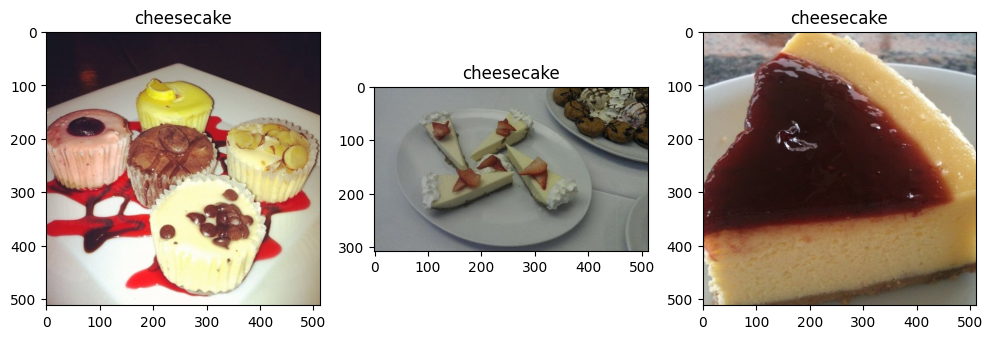

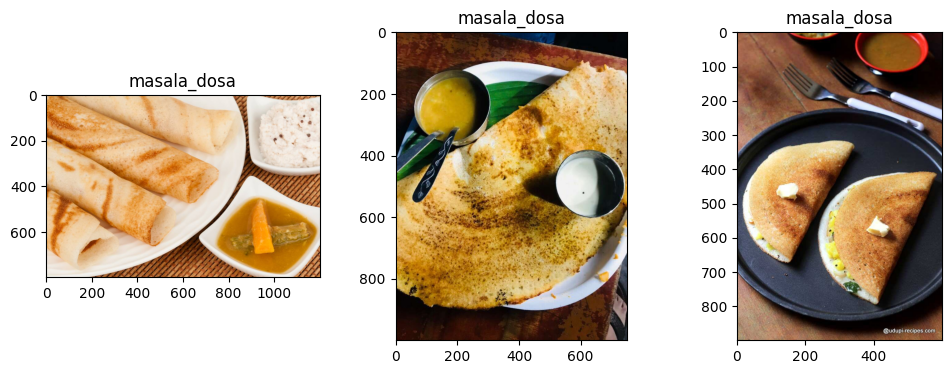

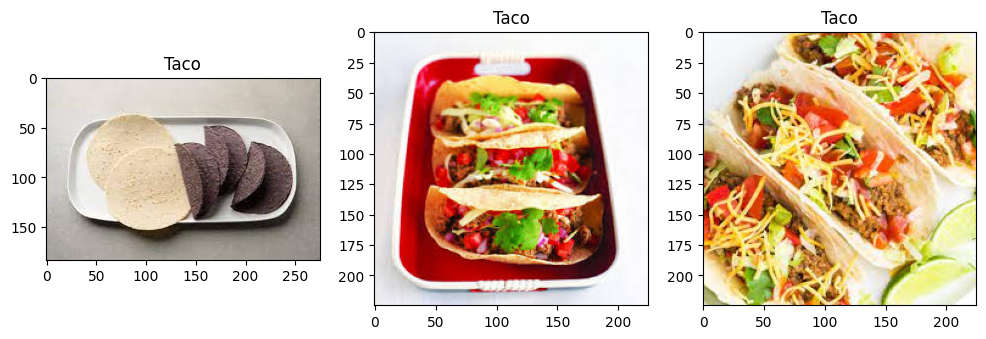

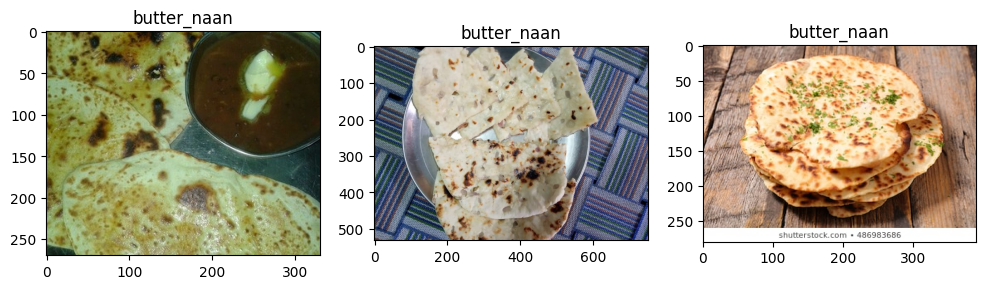

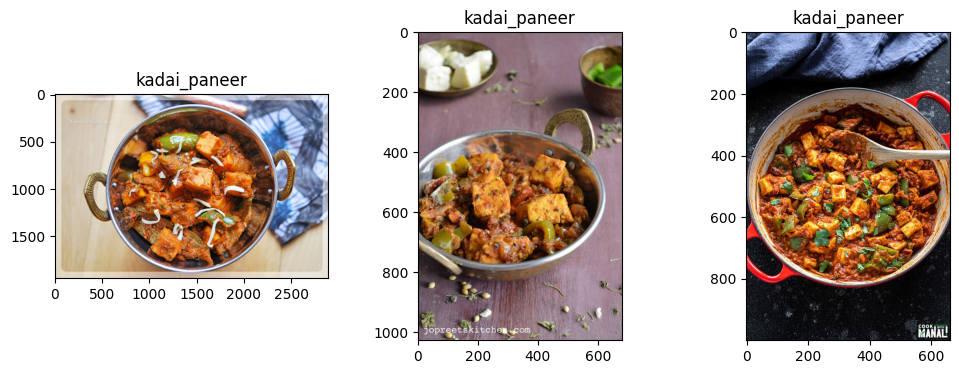

...

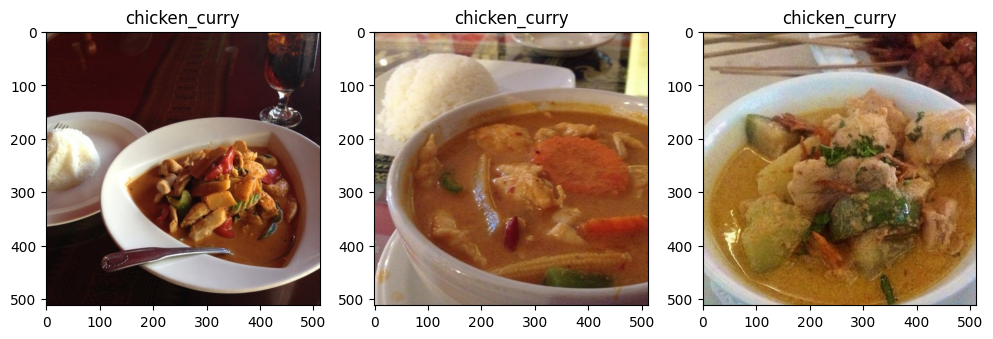

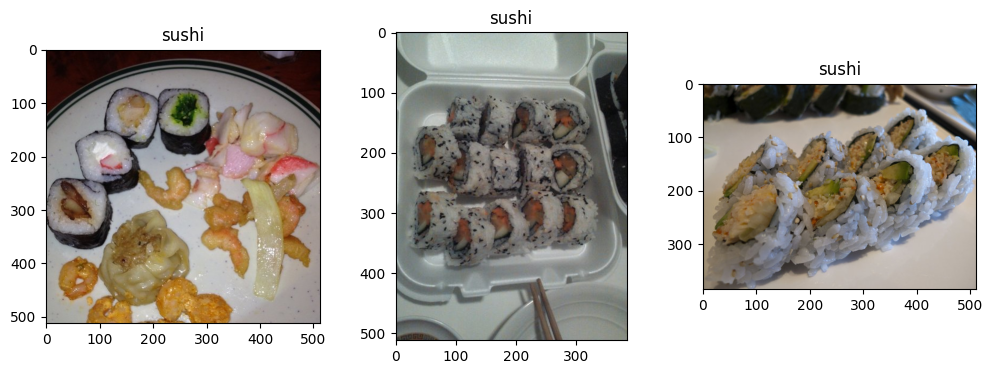

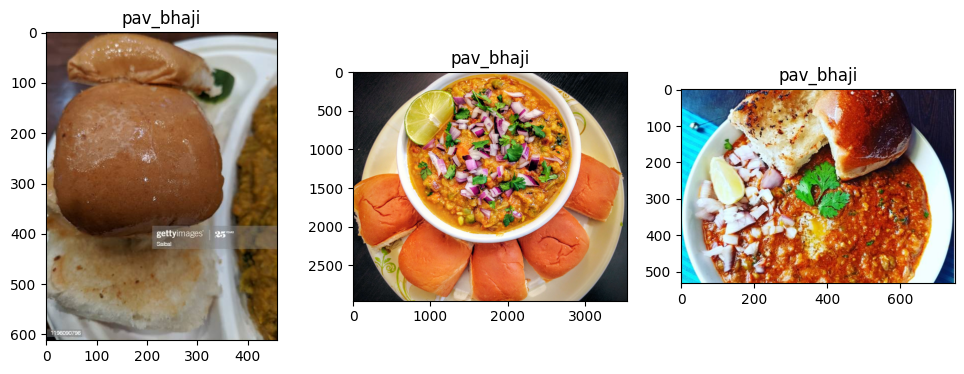

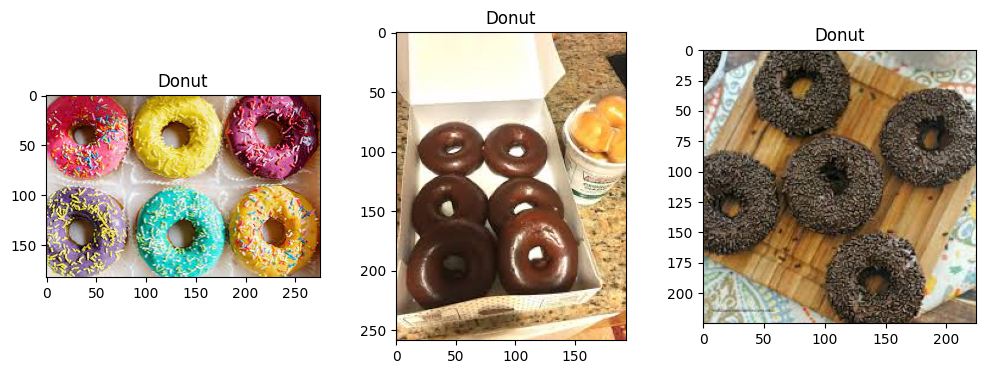

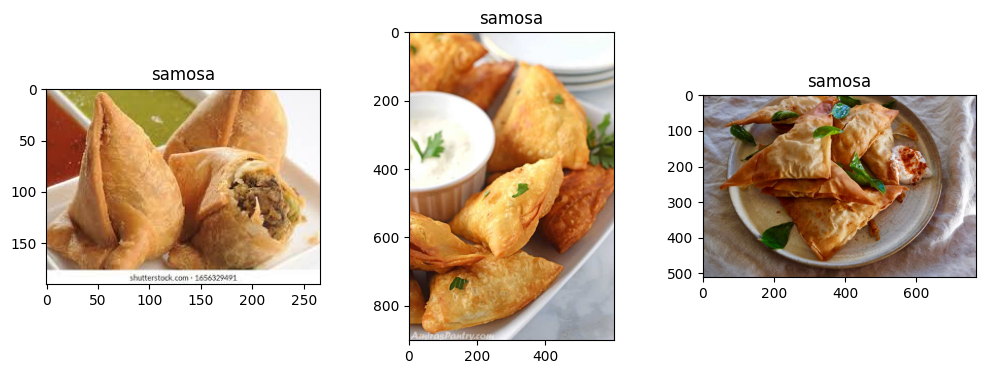

In [9]:
# Directorio raíz del conjunto de datos
dataset_root = "/content/food-image-classification-dataset/Food Classification dataset"

# Muestra ejemplos de imágenes de cada clase
num_examples_per_class = 3
for food_class in classes:
    class_dir = os.path.join(dataset_root, food_class)
    image_files = os.listdir(class_dir)
    random.shuffle(image_files)  # Baraja las imágenes para mostrar ejemplos aleatorios
    plt.figure(figsize=(12, 4))
    for i in range(num_examples_per_class):
        img_path = os.path.join(class_dir, image_files[i])
        img = Image.open(img_path)
        plt.subplot(1, num_examples_per_class, i + 1)
        plt.imshow(img)
        plt.title(food_class)
    plt.show()


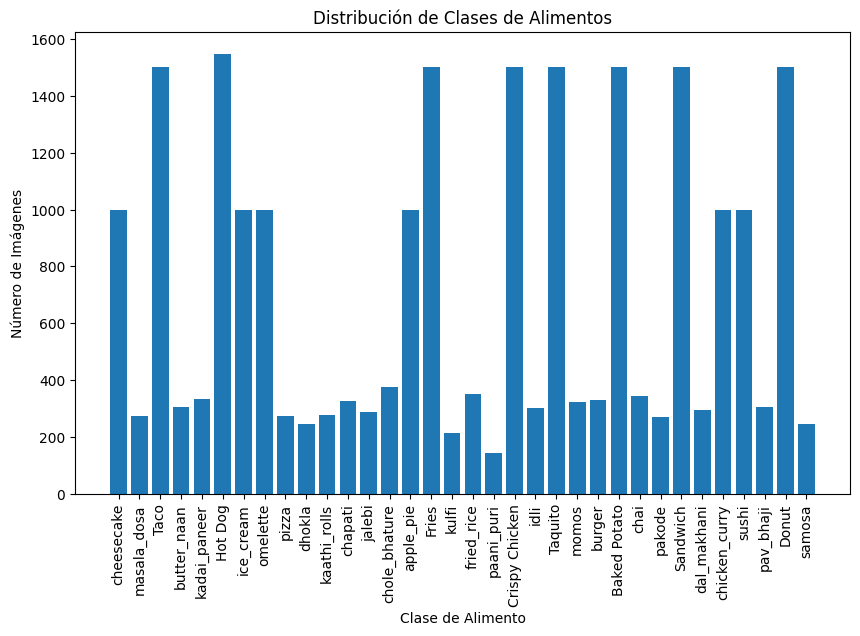


Número total de imágen: 23873


In [10]:
# Calcula el número de imágenes por clase
num_images_per_class = {food_class: len(os.listdir(os.path.join(dataset_root, food_class))) for food_class in classes}

# Muestra la distribución de clases
plt.figure(figsize=(10, 6))
plt.bar(num_images_per_class.keys(), num_images_per_class.values())
plt.xlabel('Clase de Alimento')
plt.ylabel('Número de Imágenes')
plt.title('Distribución de Clases de Alimentos')
plt.xticks(rotation=90)
plt.show()

n_images = sum(num_images_per_class.values())
print(f"\nNúmero total de imágen: {n_images}")

In [11]:
# Calcula el número de imágenes por clase
num_images_per_class = {food_class: len(os.listdir(os.path.join(dataset_root, food_class))) for food_class in classes}
num_images_per_class

{'cheesecake': 1000,
 'masala_dosa': 273,
 'Taco': 1500,
 'butter_naan': 307,
 'kadai_paneer': 334,
 'Hot Dog': 1548,
 'ice_cream': 1000,
 'omelette': 1000,
 'pizza': 275,
 'dhokla': 245,
 'kaathi_rolls': 279,
 'chapati': 327,
 'jalebi': 288,
 'chole_bhature': 376,
 'apple_pie': 1000,
 'Fries': 1500,
 'kulfi': 214,
 'fried_rice': 350,
 'paani_puri': 144,
 'Crispy Chicken': 1500,
 'idli': 302,
 'Taquito': 1500,
 'momos': 323,
 'burger': 331,
 'Baked Potato': 1500,
 'chai': 344,
 'pakode': 269,
 'Sandwich': 1500,
 'dal_makhani': 295,
 'chicken_curry': 1000,
 'sushi': 1000,
 'pav_bhaji': 305,
 'Donut': 1500,
 'samosa': 244}

In [12]:
# Obtiene las dimensiones de una imagen de muestra
random_class = random.choice(classes)
random_img = random.choice(os.listdir(os.path.join(dataset_root,random_class)))
sample_image_path = os.path.join(dataset_root, random_class, random_img)
sample_image = Image.open(sample_image_path)
image_width, image_height = sample_image.size
print(f"Ancho de imagen: {image_width}px, Alto de imagen: {image_height}px")


Ancho de imagen: 1280px, Alto de imagen: 853px


In [14]:
# Inicializa listas para almacenar las rutas de imágenes y etiquetas
image_paths = []
labels = []

# Itera a través de las carpetas de clases de alimentos
for food_class in subdirectories:
    class_dir = os.path.join(dataset_dir, food_class)
    if os.path.isdir(class_dir):
        # Enumera los archivos de imágenes en la carpeta de la clase
        class_image_paths = [os.path.join(class_dir, filename) for filename in os.listdir(class_dir)]
        # Agrega las rutas de imágenes a la lista
        image_paths.extend(class_image_paths)
        # Agrega las etiquetas correspondientes (nombre de la clase) a la lista
        labels.extend([food_class] * len(class_image_paths))

In [15]:
# Crear un DataFrame con las rutas de las imágenes y las etiquetas
data = {'filename': image_paths, 'class': labels}
df = pd.DataFrame(data)
df.groupby('class').count()

,filename
class,
Baked Potato,1500
Crispy Chicken,1500
Donut,1500
Fries,1500
Hot Dog,1548
Sandwich,1500
Taco,1500
Taquito,1500
apple_pie,1000


In [16]:
desired_min_samples = 800
desired_max_samples = 250

# Lista de clases con más de 800 y menos de 250 muestras
df_classes = df['class'].value_counts()

overpopulated_classes = df_classes[df_classes > desired_min_samples].index.tolist()
underpopulated_classes = df_classes[df_classes < desired_max_samples].index.tolist()

# Crear un nuevo conjunto de datos balanceado
new_data = []

for i_class in overpopulated_classes:
    # Filtra las muestras de la clase actual
    actual_class = df[df['class'] == i_class]

    # Selecciona aleatoriamente 800 muestras de la clase actual
    selected_samples = actual_class.sample(n=desired_min_samples, random_state=42)

    # Agrega las muestras seleccionadas al nuevo conjunto de datos
    new_data.append(selected_samples)

# Concatena los datos de todas las clases seleccionadas
clipped_data = pd.concat(new_data)

# Conjunto de datos con 800 muestras por cada clase en overpopulated_classes
clipped_data.groupby('class').count()

,filename
class,
Baked Potato,800
Crispy Chicken,800
Donut,800
Fries,800
Hot Dog,800
Sandwich,800
Taco,800
Taquito,800
apple_pie,800


In [17]:
underpopulated_classes

['dhokla', 'samosa', 'kulfi', 'paani_puri']

In [18]:
# Elimina las filas correspondientes a estas clases del DataFrame original (<250 y >800)
data_to_incrase = df[~df['class'].isin(underpopulated_classes)]
data_to_incrase = data_to_incrase[~data_to_incrase['class'].isin(overpopulated_classes)]

# Clases con menos de 800 muestras y más de 250 muestras.
data_to_incrase.groupby('class').count()

,filename
class,
burger,331
butter_naan,307
chai,344
chapati,327
chole_bhature,376
dal_makhani,295
fried_rice,350
idli,302
jalebi,288


In [19]:
# Dataset filtrado
filtered_data = pd.concat([clipped_data, data_to_incrase])
filtered_data.groupby('class').count()

,filename
class,
Baked Potato,800
Crispy Chicken,800
Donut,800
Fries,800
Hot Dog,800
Sandwich,800
Taco,800
Taquito,800
apple_pie,800


In [20]:
from PIL import Image
import numpy as np

def load_and_preprocess_image(image_path, target_size=(224, 224)):
    # Carga la imagen desde la ruta
    img = Image.open(image_path)

    # Redimensiona la imagen al tamaño objetivo
    img = img.resize(target_size)

    # Convierte la imagen en un array numpy
    img_array = np.array(img)

    # Normaliza los valores de píxeles al rango [0, 1]
    img_array = img_array / 255.0

    return img_array

In [21]:
from keras.preprocessing.image import ImageDataGenerator
import numpy as np
from PIL import Image

# Define el generador de datos para aumentar las muestras
augmentation_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    rotation_range=20,      # Rango de rotación aleatoria
    width_shift_range=0.2,  # Desplazamiento horizontal aleatorio
    height_shift_range=0.2, # Desplazamiento vertical aleatorio
    shear_range=0.2,        # Distorsión de corte aleatoria
    zoom_range=0.2,         # Ampliación aleatoria
    horizontal_flip=True,   # Volteo horizontal aleatorio
    fill_mode='nearest'     # Estrategia de relleno
)

# Encuentra las clases con menos de 800 muestras
classes_below_800 = filtered_data['class'].value_counts()
classes_below_800 = classes_below_800[classes_below_800 < 800].index.tolist()

# Crea un DataFrame para almacenar las muestras generadas
augmented_data = pd.DataFrame(columns=['filename', 'class'])

# Define el tamaño del lote
batch_size = 24

# Itera sobre las clases con menos de 800 muestras
for class_name in classes_below_800:
    # Filtra las muestras de la clase actual
    class_df = filtered_data[filtered_data['class'] == class_name]

    # Calcula cuántas muestras adicionales se necesitan
    samples_needed = 800 - len(class_df)

    # Convierte las imágenes en un array numpy
    images = [load_and_preprocess_image(image_path) for image_path in class_df['filename']]

    # Genera muestras adicionales en lotes
    num_batches = samples_needed // batch_size
    for batch in range(num_batches):
        augmented_images = []
        augmented_image_paths = []  # Agrega esta lista para almacenar las rutas de las imágenes
        for i in range(batch_size):
            augmented_image = augmentation_datagen.random_transform(images[i])
            augmented_images.append(augmented_image)
            augmented_image_paths.append(class_df.iloc[i]['filename'])  # Almacena la ruta original
        # Convierte las listas de imágenes y rutas en un DataFrame y agrega la clase
        augmented_samples_df = pd.DataFrame({'filename': augmented_image_paths, 'class': [class_name] * batch_size})
        augmented_data = pd.concat([augmented_data, augmented_samples_df], ignore_index=True)


# Concatena las muestras generadas con el DataFrame original
balanced_data = pd.concat([filtered_data, augmented_data])

# Guarda el DataFrame con los datos generados en un archivo CSV
balanced_data.to_csv('balanced_data.csv', index=False)

In [22]:
# Verifica que todas las clases ahora tengan 800 muestras
balanced_data.groupby('class').count()

,filename
class,
Baked Potato,800
Crispy Chicken,800
Donut,800
Fries,800
Hot Dog,800
Sandwich,800
Taco,800
Taquito,800
apple_pie,800


In [23]:
# Carga el DataFrame desde el archivo CSV
balanced_data = pd.read_csv('balanced_data.csv')

In [24]:
balanced_data

,filename,class
0,/content/food-image-classification-dataset/Foo...,Hot Dog
1,/content/food-image-classification-dataset/Foo...,Hot Dog
2,/content/food-image-classification-dataset/Foo...,Hot Dog
3,/content/food-image-classification-dataset/Foo...,Hot Dog
4,/content/food-image-classification-dataset/Foo...,Hot Dog
...,...,...
23781,/content/food-image-classification-dataset/Foo...,pakode
23782,/content/food-image-classification-dataset/Foo...,pakode
23783,/content/food-image-classification-dataset/Foo...,pakode
23784,/content/food-image-classification-dataset/Foo...,pakode
